### 1. 배경 이미지 합성

In [ ]:
!pip install opencv-python-headless
!pip install numpy

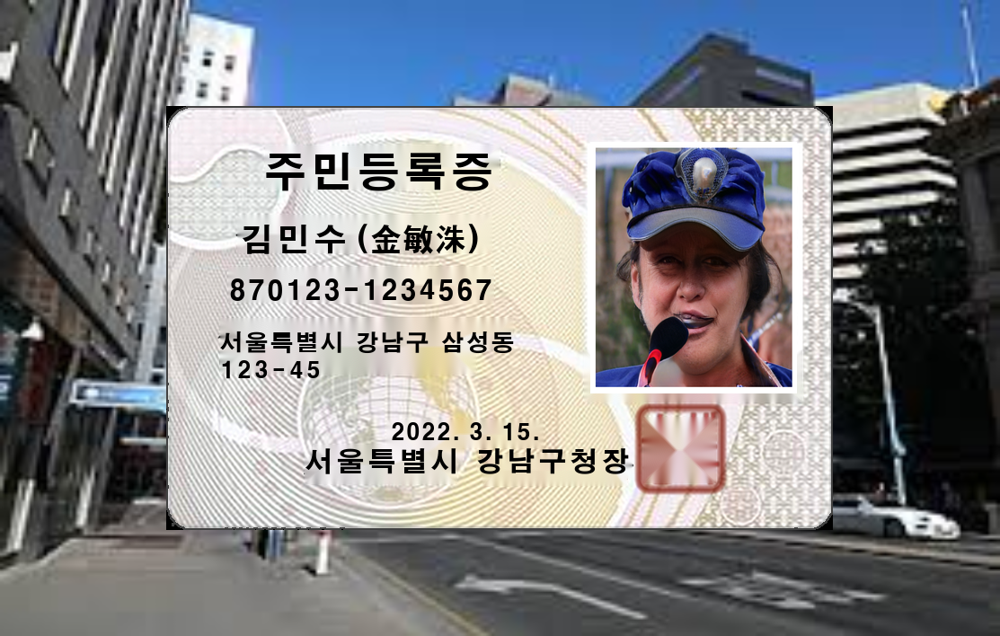

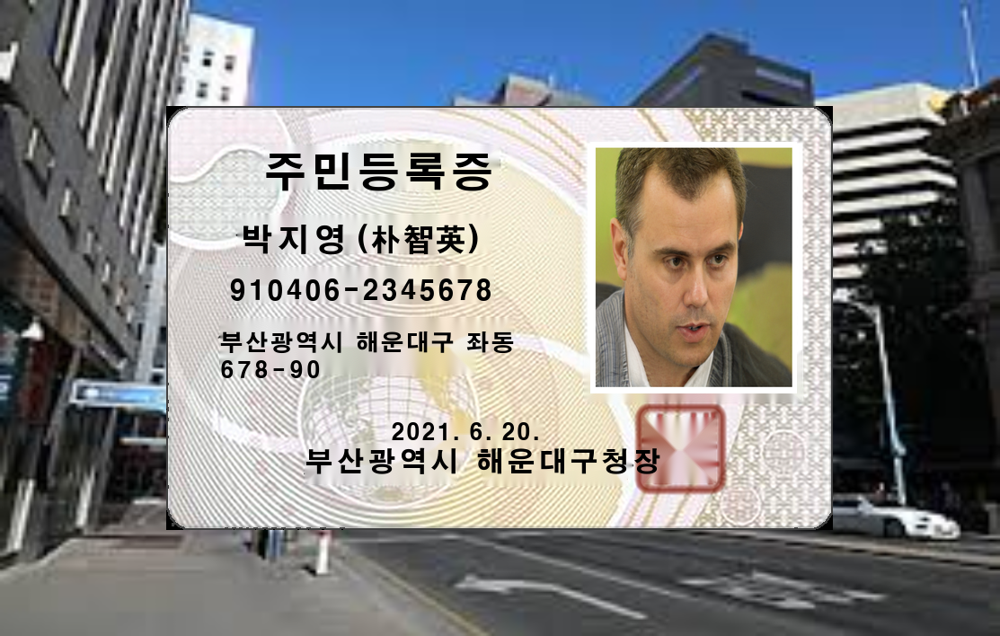

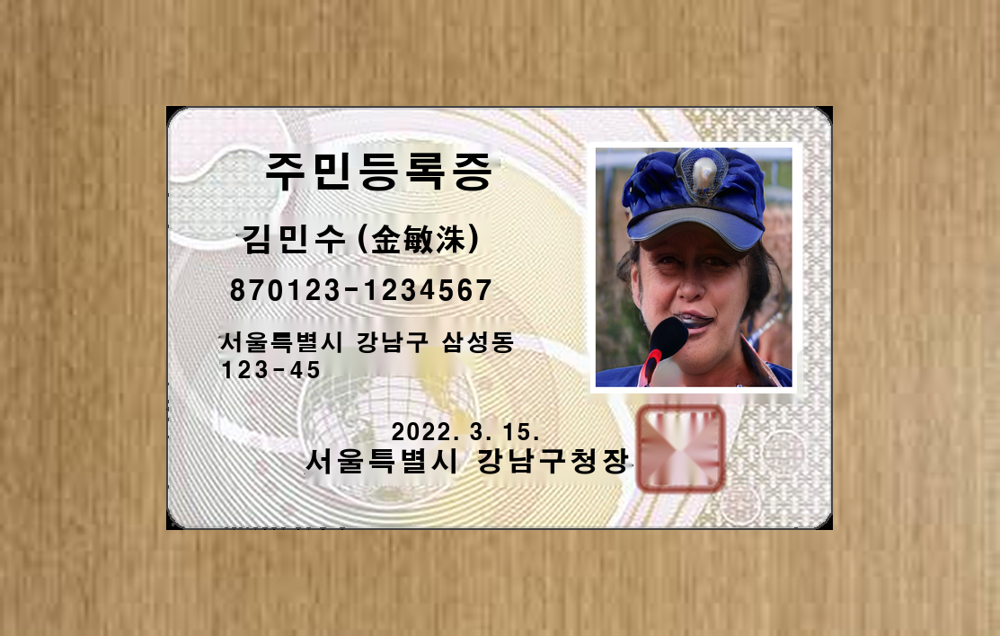

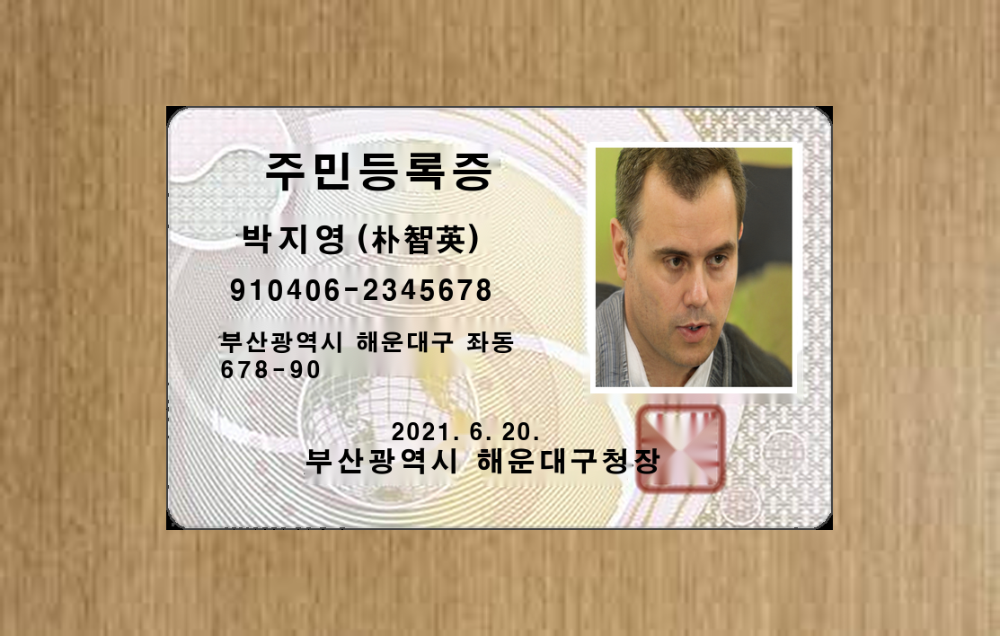

모든 이미지 합성이 완료되었습니다.


In [ ]:
import cv2
import os
from google.colab.patches import cv2_imshow

# 디렉토리 경로 설정
background_folder = "/content/background"  # 배경 이미지 폴더 경로
images_folder = "/content/images"  # 신분증 이미지 폴더 경로
output_folder = "/content/result"  # 결과물 저장 폴더 경로

# 결과물 저장 폴더가 존재하지 않으면 생성
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# 배경 이미지와 신분증 이미지를 읽어와서 합성
for background_file in os.listdir(background_folder):
    for image_file in os.listdir(images_folder):
        # 배경 이미지와 신분증 이미지 경로 설정
        background_img_path = os.path.join(background_folder, background_file)
        id_card_img_path = os.path.join(images_folder, image_file)

        # 배경 이미지와 신분증 이미지 불러오기
        background_img = cv2.imread(background_img_path)
        id_card_img = cv2.imread(id_card_img_path)

        # 배경 이미지 크기 조정 (신분증보다 커야 하므로, 신분증 크기의 1.5배로 조정)
        background_height = int(id_card_img.shape[0] * 1.5)
        background_width = int(id_card_img.shape[1] * 1.5)
        background_img = cv2.resize(background_img, (background_width, background_height))

        # 신분증 이미지를 배경 이미지 중앙에 위치시키기 위해 좌표 계산
        x_offset = (background_width - id_card_img.shape[1]) // 2
        y_offset = (background_height - id_card_img.shape[0]) // 2

        # 배경 이미지에 신분증 이미지를 오버레이
        overlay_img = background_img.copy()
        overlay_img[y_offset:y_offset+id_card_img.shape[0], x_offset:x_offset+id_card_img.shape[1]] = id_card_img

        # 결과물 저장 경로 설정
        output_file_name = f"{os.path.splitext(image_file)[0]}_{os.path.splitext(background_file)[0]}.png"
        output_img_path = os.path.join(output_folder, output_file_name)

        # 결과 이미지 저장
        cv2.imwrite(output_img_path, overlay_img)
        cv2_imshow(overlay_img)

print("모든 이미지 합성이 완료되었습니다.")


### 2. 다양한 환경에서 촬영 반영

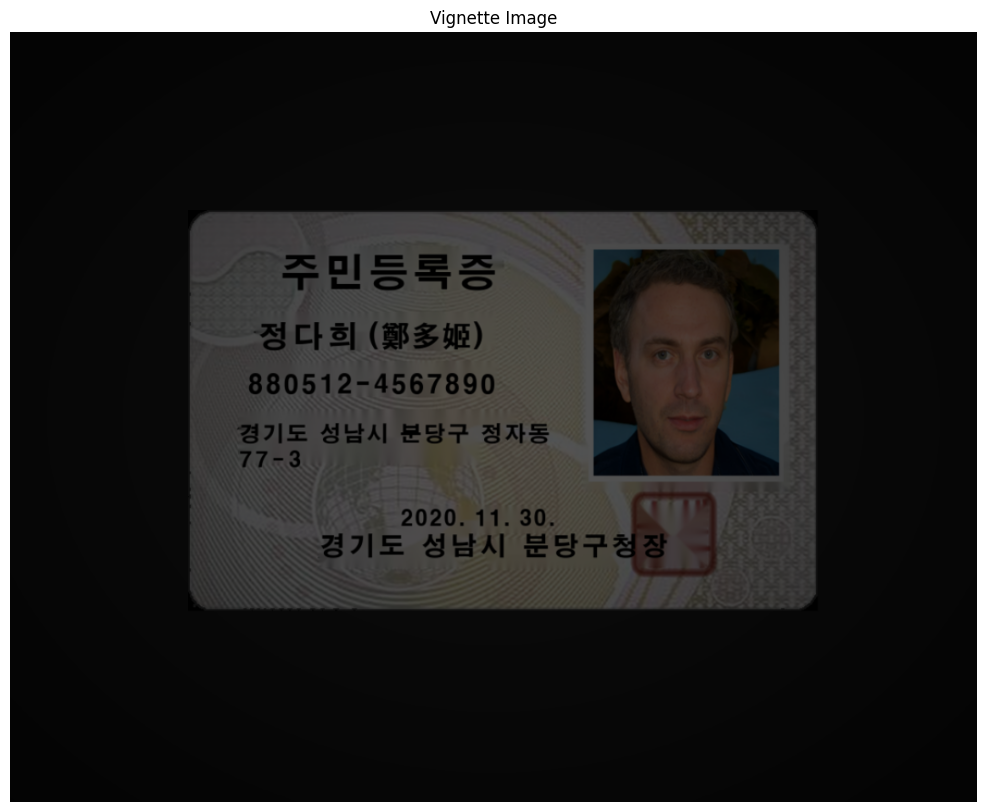

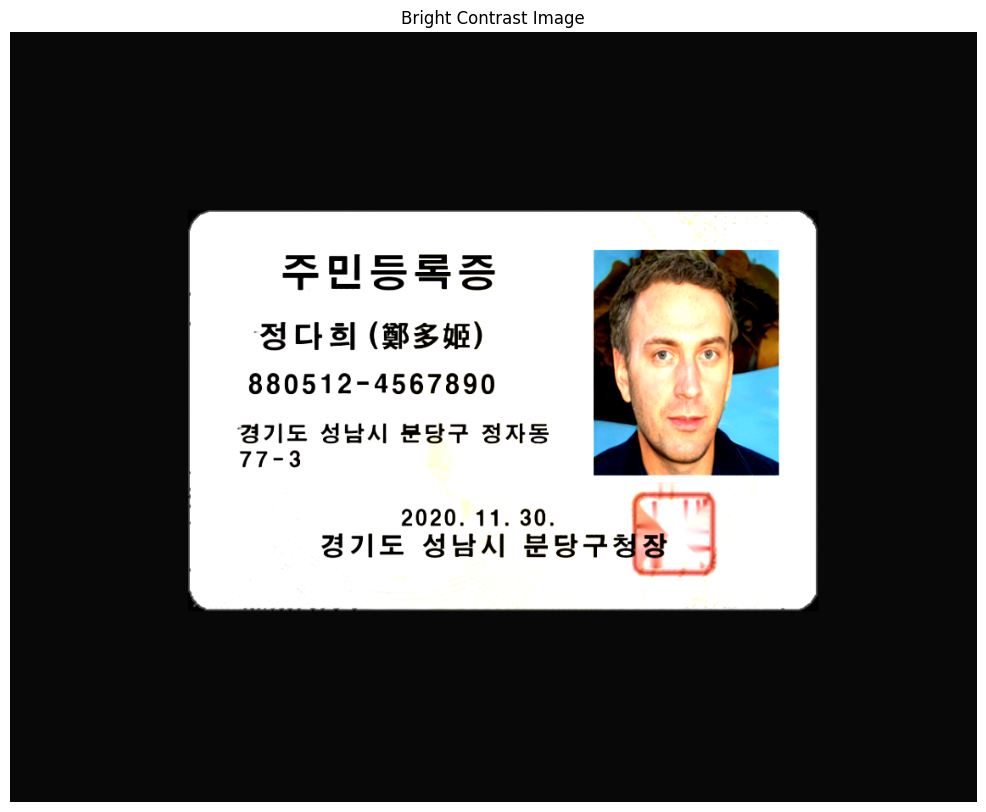

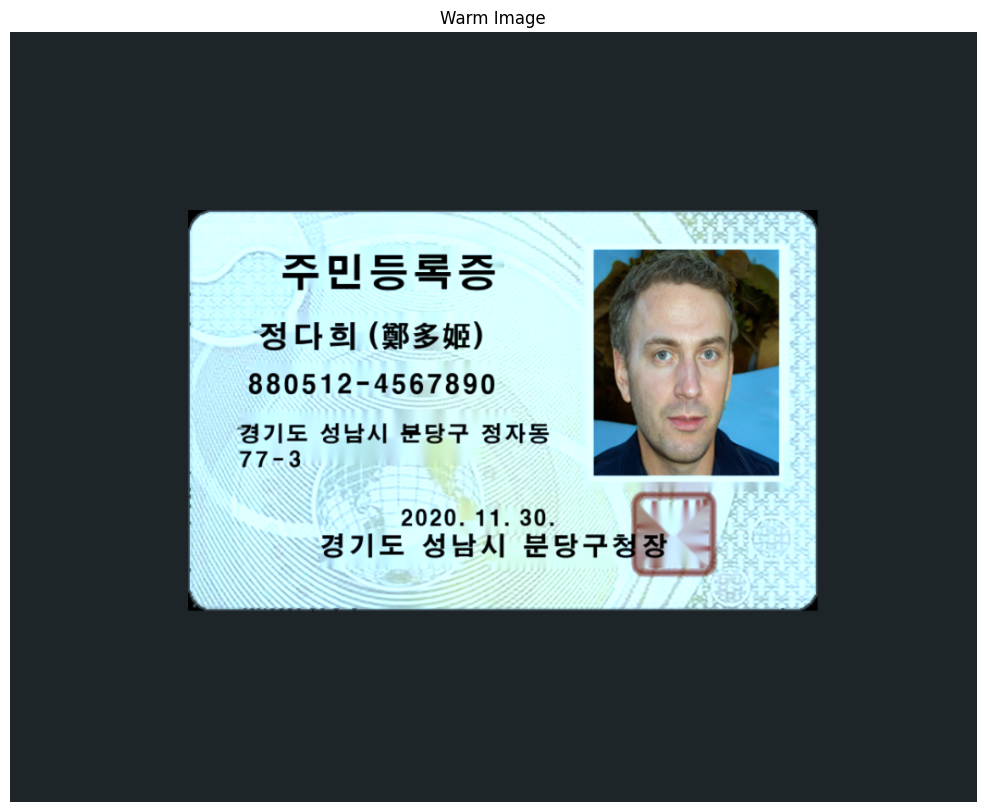

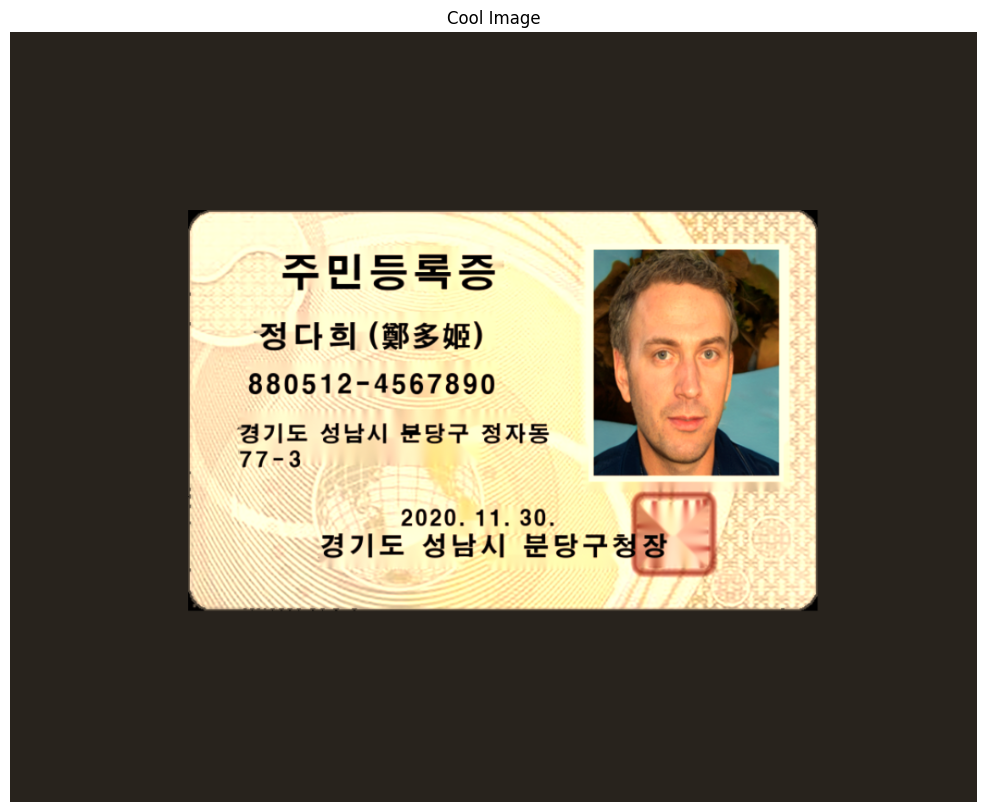

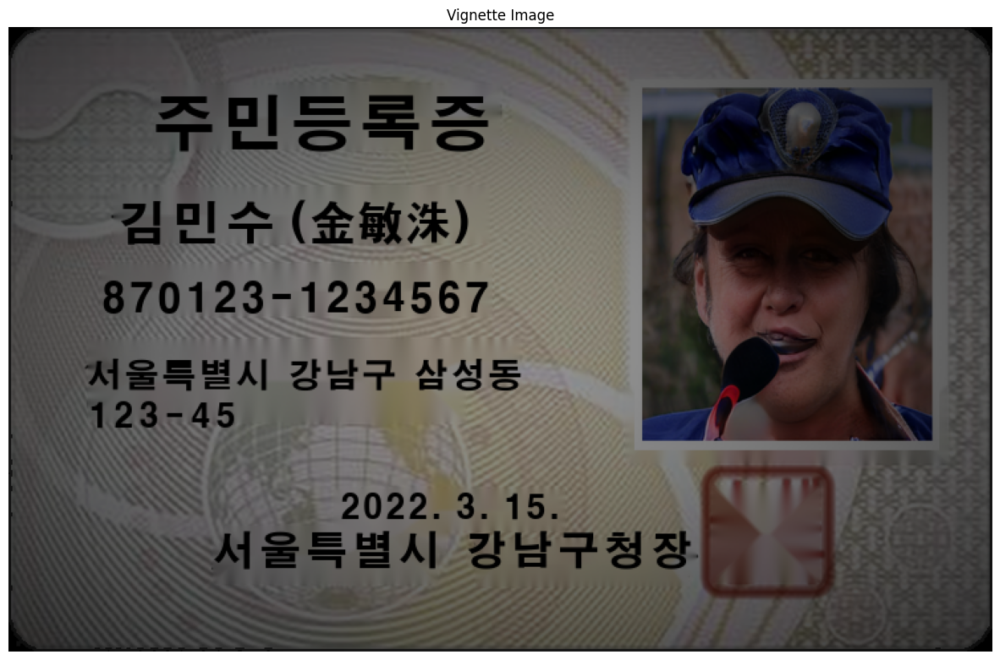

...

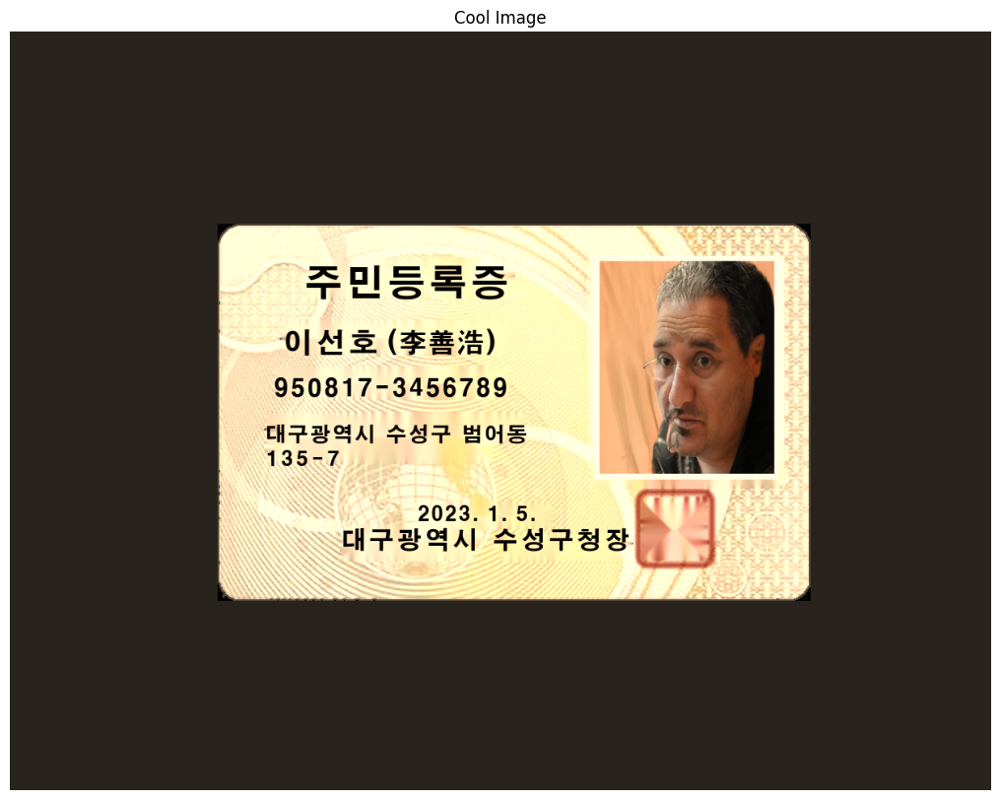

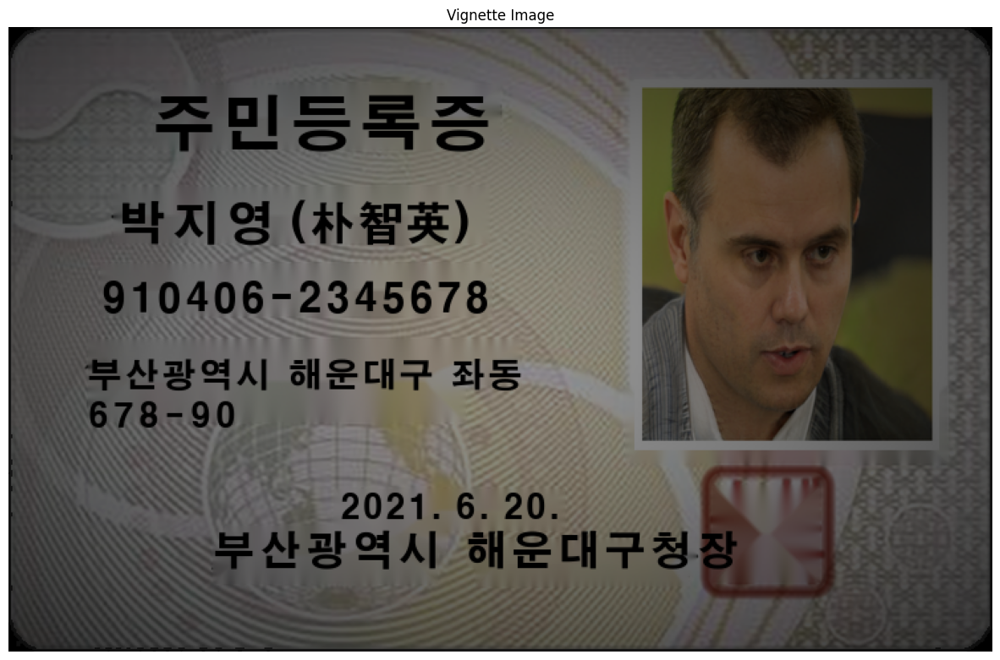

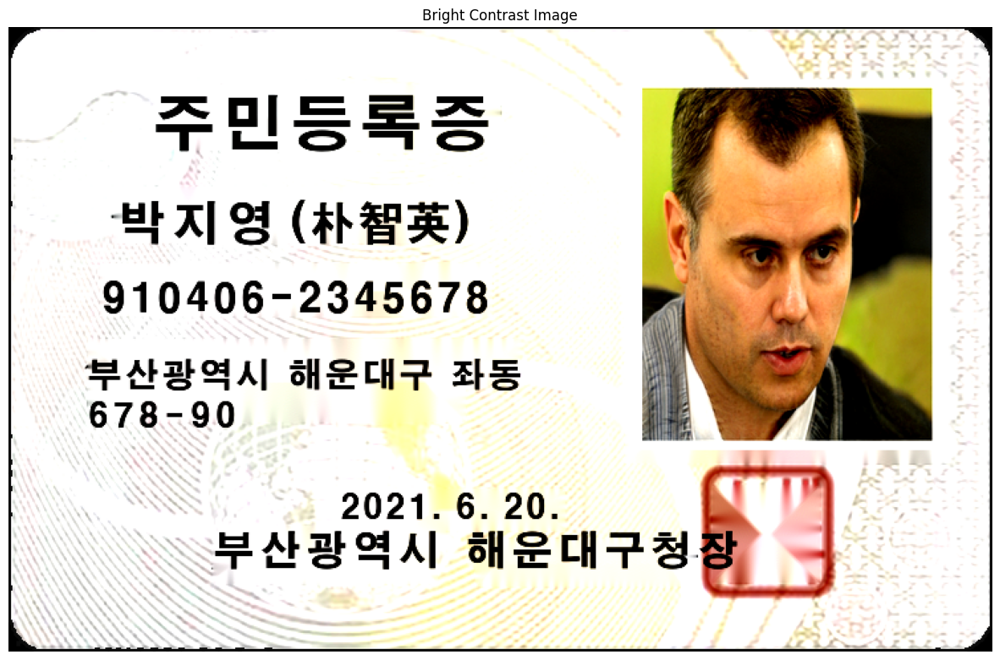

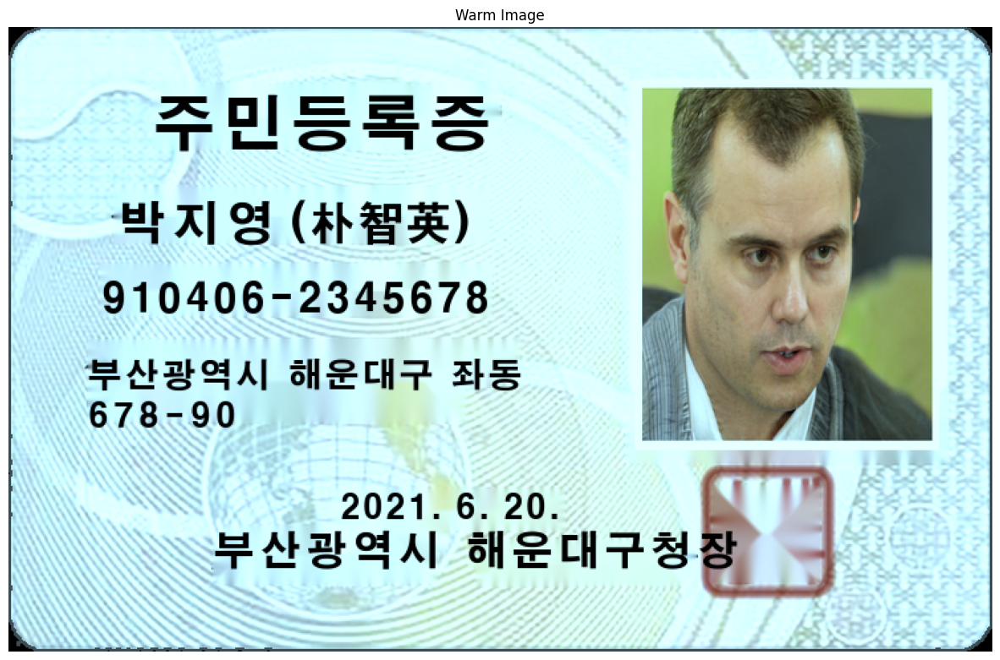

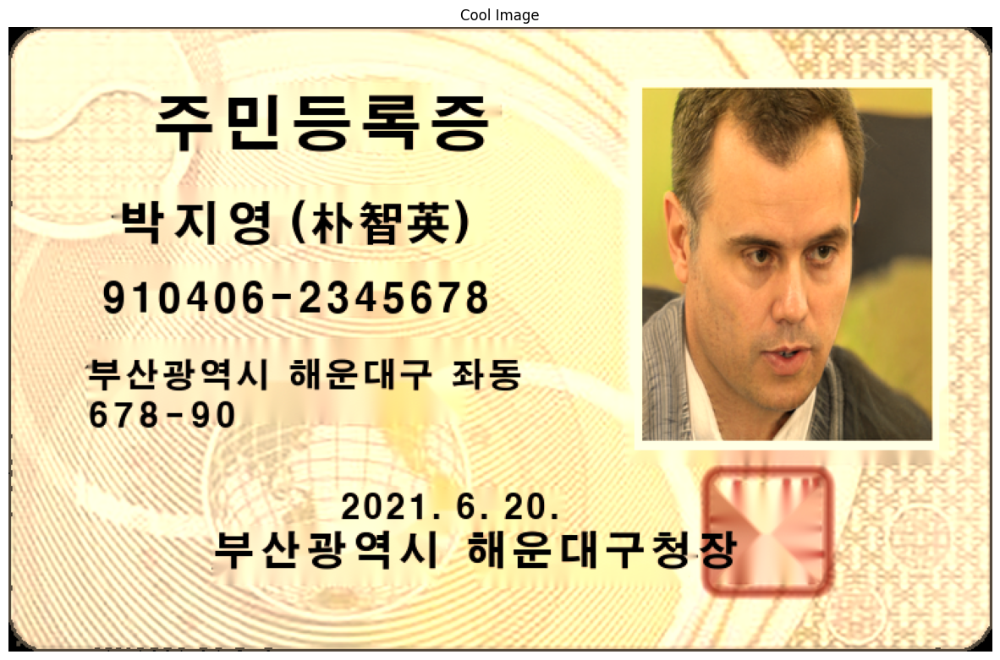

In [ ]:
import cv2
import numpy as np
from PIL import Image, ImageEnhance, ImageFilter
import matplotlib.pyplot as plt


# 1. Vignette Effect: 렌즈 가장자리 어두움 효과
def apply_vignette(image, level=2):
    rows, cols = image.shape[:2]
    X_resultant_kernel = cv2.getGaussianKernel(cols, cols // level)
    Y_resultant_kernel = cv2.getGaussianKernel(rows, rows // level)
    resultant_kernel = Y_resultant_kernel * X_resultant_kernel.T
    mask = 255 * resultant_kernel / np.linalg.norm(resultant_kernel)

    vignette = np.copy(image)
    for i in range(3):
        vignette[:, :, i] = vignette[:, :, i] * mask
    return vignette

# 2. Adjust Brightness and Contrast: 다른 조명 조건 모방
def adjust_brightness_contrast(image, brightness=1.0, contrast=1.0):
    pil_img = Image.fromarray(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    enhancer = ImageEnhance.Brightness(pil_img)
    image = enhancer.enhance(brightness)
    enhancer = ImageEnhance.Contrast(image)
    image = enhancer.enhance(contrast)
    return cv2.cvtColor(np.array(image), cv2.COLOR_RGB2BGR)

# 3. Color Temperature: 색온도 조정으로 다양한 환경 모방
def apply_color_temperature(image, temperature):
    if temperature == "warm":
        matrix = np.array([[1.2, 0.05, 0], [0.05, 1.1, 0], [0, 0, 0.9]])
    elif temperature == "cool":
        matrix = np.array([[0.9, 0, 0], [0, 1.1, 0], [0, 0.05, 1.2]])
    else:
        matrix = np.eye(3)
    return cv2.transform(image, matrix)

# 4. Main function to apply all effects
def apply_camera_effects(image_path):
    image = cv2.imread(image_path)

    # Apply various effects

    vignette_image = apply_vignette(image)
    bright_contrast_image = adjust_brightness_contrast(image, brightness=1.2, contrast=1.5)
    warm_image = apply_color_temperature(image, "warm")
    cool_image = apply_color_temperature(image, "cool")

    # Display the images using matplotlib
    images = [vignette_image, bright_contrast_image, warm_image, cool_image]
    titles = [ 'Vignette Image', 'Bright Contrast Image', 'Warm Image', 'Cool Image']


    for i in range(len(images)):
        plt.figure(figsize=(15,10))
        plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
        plt.title(titles[i])
        plt.axis('off')
        plt.show()


image_folder="/content/images"
for image_file in os.listdir(image_folder):
  image_path = os.path.join(image_folder, image_file)
  apply_camera_effects(image_path)
